# PROBLEM STATEMENT

The dataset provided to you has data for several websites owned by the same company and they
are asking for your help for what should be their approach to set reserve prices and what is the
range for reserve prices they should be setting for July. The data is only of the actual revenue
generation and not at bid level. The dataset has the following columns:

1. Date
2. site_id : each id denotes a different website
3. ad_type_id : each id denotes a different ad_type. These can be display ads , video ads,
text ads etc
4. geo_id : each id denotes a different country. our maximum traffic is from english
speaking countries
5. device_category_id : each id denoted a different device_category like desktop , mobile,
tablet
6. advertiser_id: each id denotes a different bidder in the auction
7. order_id : can be ignored
8. line_item_type_id : can be ignored
9. os_id : each id denotes a different operating system for mobile device category only
(android , ios etc) . for all other device categories, os_id will correspond to not_mobile
10. integration_type_id : it describes how the demand partner is setup within a publisher&#39;s
ecosystem - can be adserver (running through the publisher adserver) or hardcoded
11. monetization_channel_id : it describes the mode through which demand partner
integrates with a particular publisher - it can be header bidding (running via prebid.js),
dynamic allocation, exchange bidding, direct etc
12. ad_unit_id - each id denotes a different ad unit (one page can have more than one ad
units)
13. total_impressions - total number of eligible impressions
14. total_revenue - measurement column measuring the revenue for the particular set of
dimensions
15. viewable_impressions - Number of impressions on the site that were viewable out of all
measurable impressions. A display ad is counted as viewable if at least 50% of its area
was displayed on screen for at least one second
16. measurable_impressions - Impressions that were measurable by Active View out of the
total number of eligible impressions. This value should generally be close to 100%. For
example, an impression that is rendering in a cross-domain iframe may not be
measurable.
17. Revenue_share_percent - not every advertiser gives all the revenue to the publisher. They
charge a certain share for the services they provide. This captures the fraction of revenue that will actually reach the publishers pocket.

QUESTIONS –

1. The person compiling the data recorded some inconsistencies within the numbers. Can
you identify and categorize these inconsistencies and errors? (ex: revenue_share_percent
cannot be more than 1 [100%])
2. For each site, which advertiser has the highest CPM, and can you track this CPM over
time?
3. What is the potential revenue range our publisher can make in July?

#### Importing the required libraries

In [1]:
import os
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, FunctionTransformer
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn import tree
from sklearn.linear_model import LinearRegression

import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot, plot

import graphviz

import seaborn as sns

import math

In [2]:
import matplotlib.pyplot as plt
from matplotlib import pyplot
import seaborn as sns 
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot, plot
from scipy.stats.mstats import mode

%matplotlib inline
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 12, 4

#### Reading and loading the dataset 

In [3]:
data = pd.read_csv('Ascendeum_Dataset2.csv')
data.head()

,date,site_id,ad_type_id,geo_id,device_category_id,advertiser_id,order_id,line_item_type_id,os_id,integration_type_id,monetization_channel_id,ad_unit_id,total_impressions,total_revenue,viewable_impressions,measurable_impressions,revenue_share_percent
0,30/06/19 0:00,351,10,187,2,84,3473,19,60,1,4,5174,16.0,0.0,2,16,1.0
1,30/06/19 0:00,351,10,187,2,84,3473,19,58,1,4,5174,6.0,0.0,0,6,1.0
2,30/06/19 0:00,351,10,147,2,84,3473,19,60,1,4,5174,4.0,0.0,0,4,1.0
3,30/06/19 0:00,351,10,147,2,84,3473,19,58,1,4,5174,4.0,0.0,0,4,1.0
4,30/06/19 0:00,348,10,147,3,79,3463,20,59,1,19,5138,4.0,0.0,0,4,1.0


In [4]:
data.tail()

,date,site_id,ad_type_id,geo_id,device_category_id,advertiser_id,order_id,line_item_type_id,os_id,integration_type_id,monetization_channel_id,ad_unit_id,total_impressions,total_revenue,viewable_impressions,measurable_impressions,revenue_share_percent
567286,01/06/19 0:00,350,10,187,3,79,3456,20,59,1,19,5168,12.0,0.0254,4,12,1.0
567287,01/06/19 0:00,350,10,187,1,79,3456,20,56,1,19,5168,68.0,0.3400,52,66,1.0
567288,01/06/19 0:00,350,10,158,1,79,3456,20,56,1,19,5168,2.0,0.0046,0,2,1.0
567289,01/06/19 0:00,350,10,33,1,79,3456,20,56,1,19,5168,6.0,0.0120,0,6,1.0
567290,01/06/19 0:00,350,10,11,1,79,3456,20,56,1,19,5168,12.0,0.0240,12,12,1.0


#### Understanding the data

In [5]:
data.shape

(567291, 17)

In [6]:
data.nunique()

date                          30
site_id                       10
ad_type_id                     2
geo_id                       219
device_category_id             5
advertiser_id                 23
order_id                      75
line_item_type_id              7
os_id                          7
integration_type_id            1
monetization_channel_id        5
ad_unit_id                   132
total_impressions           1981
total_revenue              10102
viewable_impressions        1159
measurable_impressions      1884
revenue_share_percent          2
dtype: int64

In [7]:
data.dtypes

date                        object
site_id                      int64
ad_type_id                   int64
geo_id                       int64
device_category_id           int64
advertiser_id                int64
order_id                     int64
line_item_type_id            int64
os_id                        int64
integration_type_id          int64
monetization_channel_id      int64
ad_unit_id                   int64
total_impressions          float64
total_revenue              float64
viewable_impressions         int64
measurable_impressions       int64
revenue_share_percent      float64
dtype: object

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 567291 entries, 0 to 567290
Data columns (total 17 columns):
date                       567291 non-null object
site_id                    567291 non-null int64
ad_type_id                 567291 non-null int64
geo_id                     567291 non-null int64
device_category_id         567291 non-null int64
advertiser_id              567291 non-null int64
order_id                   567291 non-null int64
line_item_type_id          567291 non-null int64
os_id                      567291 non-null int64
integration_type_id        567291 non-null int64
monetization_channel_id    567291 non-null int64
ad_unit_id                 567291 non-null int64
total_impressions          567291 non-null float64
total_revenue              567291 non-null float64
viewable_impressions       567291 non-null int64
measurable_impressions     567291 non-null int64
revenue_share_percent      567291 non-null float64
dtypes: float64(3), int64(13), object(1)
memory u

In [9]:
data.describe()

,site_id,ad_type_id,geo_id,device_category_id,advertiser_id,order_id,line_item_type_id,os_id,integration_type_id,monetization_channel_id,ad_unit_id,total_impressions,total_revenue,viewable_impressions,measurable_impressions,revenue_share_percent
count,567291.000000,567291.000000,567291.000000,567291.000000,567291.000000,567291.000000,567291.000000,567291.000000,567291.0,567291.000000,567291.000000,567291.000000,567291.000000,567291.000000,567291.000000,567291.000000
mean,347.107775,10.220578,110.226133,1.899669,262.084295,1951.273747,12.632081,57.217194,1.0,14.433716,5136.436645,33.673675,0.052107,12.838251,32.152818,1.000001
std,2.930371,1.222863,66.177820,0.791982,627.325490,1652.545702,6.812571,1.956012,0.0,7.135874,62.508575,220.865454,13.294843,101.989184,207.096504,0.000465
min,342.000000,10.000000,1.000000,1.000000,8.000000,45.000000,3.000000,15.000000,1.0,1.000000,5050.000000,0.000000,-9999.000000,0.000000,0.000000,1.000000
25%,345.000000,10.000000,39.000000,1.000000,79.000000,45.000000,4.000000,56.000000,1.0,4.000000,5099.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,346.000000,10.000000,122.000000,2.000000,88.000000,3438.000000,11.000000,57.000000,1.0,19.000000,5127.000000,2.000000,0.000000,0.000000,2.000000,1.000000
75%,350.000000,10.000000,183.000000,3.000000,139.000000,3460.000000,19.000000,58.000000,1.0,19.000000,5168.000000,6.000000,0.005400,2.000000,6.000000,1.000000
max,351.000000,17.000000,308.000000,5.000000,2646.000000,3489.000000,20.000000,60.000000,1.0,21.000000,5443.000000,14452.000000,83.822000,7392.000000,13756.000000,1.350000


In [10]:
data.describe(include = 'object')

,date
count,567291
unique,30
top,24/06/19 0:00
freq,23252


#### Checking for missing values

In [11]:
data.isnull().sum()

date                       0
site_id                    0
ad_type_id                 0
geo_id                     0
device_category_id         0
advertiser_id              0
order_id                   0
line_item_type_id          0
os_id                      0
integration_type_id        0
monetization_channel_id    0
ad_unit_id                 0
total_impressions          0
total_revenue              0
viewable_impressions       0
measurable_impressions     0
revenue_share_percent      0
dtype: int64

We understand that there are no missing values in the dataset and continue our analysis

#### Overview of the data

In [12]:
#!pip install pandas-profiling[notebook,html]

In [13]:
import pandas_profiling

In [14]:
pandas_profiling.ProfileReport(data)

We get a detailed report and insights on the entire dataset including the features - categorical & numerical, missing values, correlation between different numerical features, unique/distinct values, and a sample of the dataset (first few & last few rows).

#### Exploratory Data Analysis & Visualization

#### Creation of a plots for numerical variables in plotly

Question 1: 

The box plot helps us identify outliers/inconsistencies in the dataset w.r.t impressions and revenue in distribution and measure variablity in the dataset.

In [15]:
def summary(x):
    x_min = data[x].min()
    x_max = data[x].max()
    Q1 = data[x].quantile(0.25)
    Q2 = data[x].quantile(0.50)
    Q3 = data[x].quantile(0.75)
    print(f'5 Point Summary of {x.capitalize()} Attribute:\n'
          f'{x.capitalize()}(min) : {x_min}\n'
          f'Q1                    : {Q1}\n'
          f'Q2(Median)            : {Q2}\n'
          f'Q3                    : {Q3}\n'
          f'{x.capitalize()}(max) : {x_max}')

    fig = plt.figure(figsize=(16, 10))
    plt.subplots_adjust(hspace = 0.6)
    sns.set_palette('pastel')
    
    plt.subplot(221)
    ax1 = sns.distplot(data[x], color = 'r')
    plt.title(f'{x.capitalize()} Density Distribution')
    
    plt.subplot(222)
    ax2 = sns.violinplot(x = data[x], palette = 'Accent', split = True)
    plt.title(f'{x.capitalize()} Violinplot')
    
    plt.subplot(223)
    ax2 = sns.boxplot(x=data[x], palette = 'cool', width=0.7, linewidth=0.6)
    plt.title(f'{x.capitalize()} Boxplot')
    
    plt.subplot(224)
    ax3 = sns.kdeplot(data[x], cumulative=True)
    plt.title(f'{x.capitalize()} Cumulative Density Distribution')
    
    plt.show()

In [16]:
def box_plot(x = 'bmi'):
    def add_values(bp, ax):
        """ This actually adds the numbers to the various points of the boxplots"""
        for element in ['whiskers', 'medians', 'caps']:
            for line in bp[element]:
                # Get the position of the element. y is the label you want
                (x_l, y),(x_r, _) = line.get_xydata()
                # Make sure datapoints exist 
                # (I've been working with intervals, should not be problem for this case)
                if not np.isnan(y): 
                    x_line_center = x_l + (x_r - x_l)/2
                    y_line_center = y  # Since it's a line and it's horisontal
                    # overlay the value:  on the line, from center to right
                    ax.text(x_line_center, y_line_center, # Position
                            '%.2f' % y, # Value (3f = 3 decimal float)
                            verticalalignment='center', # Centered vertically with line 
                            fontsize=12, backgroundcolor="white")

    fig, axes = plt.subplots(1, figsize=(4, 8))

    red_diamond = dict(markerfacecolor='r', marker='D')

    bp_dict = data.boxplot(column = x, 
                             grid=True, 
                             figsize=(4, 8), 
                             ax=axes, 
                             vert = True, 
                             notch=False, 
                             widths = 0.7, 
                             showmeans = True, 
                             whis = 1.5,
                             flierprops = red_diamond,
                             boxprops= dict(linewidth=3.0, color='black'),
                             whiskerprops=dict(linewidth=3.0, color='black'),
                             return_type = 'dict')

    add_values(bp_dict, axes)

    plt.title(f'{x.capitalize()} Boxplot', fontsize=16)
    plt.ylabel(f'{x.capitalize()}', fontsize=14)
    plt.show()
    
    skew = data[x].skew()
    Q1 = data[x].quantile(0.25)
    Q3 = data[x].quantile(0.75)
    IQR = Q3 - Q1
    total_outlier_num = ((data[x] < (Q1 - 1.5 * IQR)) | (data[x] > (Q3 + 1.5 * IQR))).sum()
    print(f'Mean {x.capitalize()} = {data[x].mean()}')
    print(f'Median {x.capitalize()} = {data[x].median()}')
    print(f'Skewness of {x}: {skew}.')
    print(f'Total number of outliers in {x} distribution: {total_outlier_num}.') 

#### 1. total_revenue

5 Point Summary of Total_revenue Attribute:
Total_revenue(min) : -9999.0
Q1                    : 0.0
Q2(Median)            : 0.0
Q3                    : 0.0054
Total_revenue(max) : 83.822


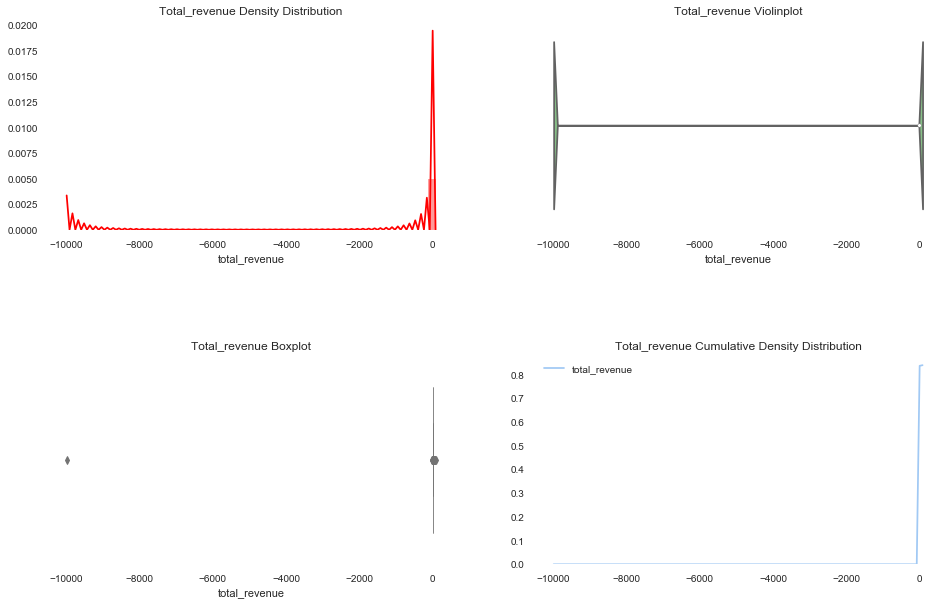

In [17]:
summary('total_revenue')

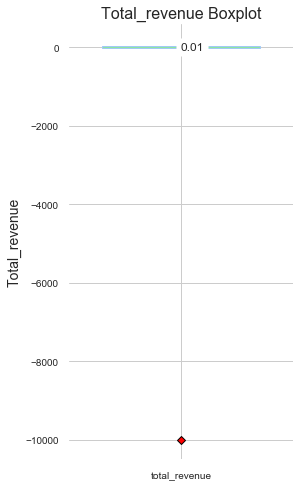

Mean Total_revenue = 0.05210699482277169
Median Total_revenue = 0.0
Skewness of total_revenue: -749.9304179686193.
Total number of outliers in total_revenue distribution: 96101.


In [18]:
box_plot('total_revenue')

#### 2. total_impressions

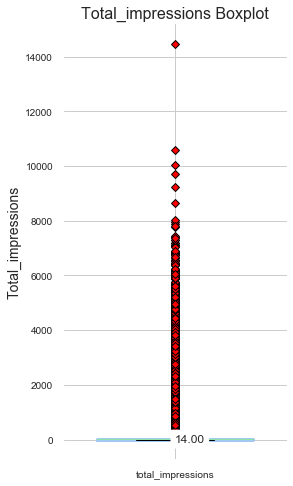

Mean Total_impressions = 33.67367541526307
Median Total_impressions = 2.0
Skewness of total_impressions: 15.181790346192207.
Total number of outliers in total_impressions distribution: 84548.


In [19]:
box_plot('total_impressions')

#### 3. viewable_impressions

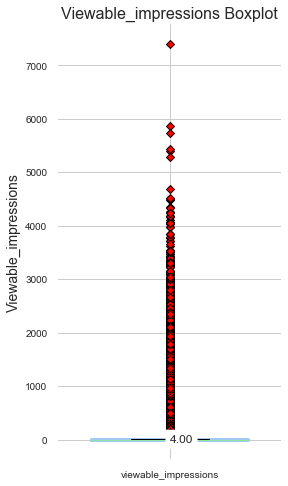

Mean Viewable_impressions = 12.83825056276232
Median Viewable_impressions = 0.0
Skewness of viewable_impressions: 19.38451531563264.
Total number of outliers in viewable_impressions distribution: 86417.


In [20]:
box_plot('viewable_impressions')

#### 4. measurable_impressions

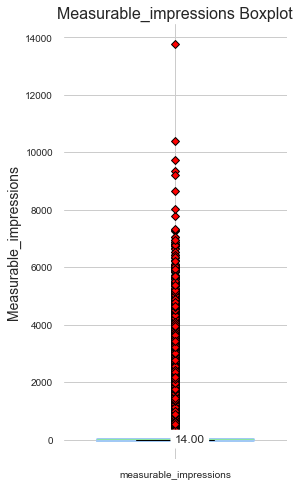

Mean Measurable_impressions = 32.15281751341023
Median Measurable_impressions = 2.0
Skewness of measurable_impressions: 15.017478563411775.
Total number of outliers in measurable_impressions distribution: 83119.


In [21]:
box_plot('measurable_impressions')

#### 5. revenue_share_percent

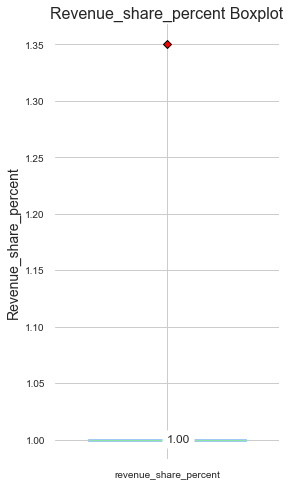

Mean Revenue_share_percent = 1.000000616967306
Median Revenue_share_percent = 1.0
Skewness of revenue_share_percent: 753.1872277196462.
Total number of outliers in revenue_share_percent distribution: 1.


In [22]:
box_plot('revenue_share_percent')

#### CPM – cost per Mille. 
This is one of the most important ways to measure performance. It is calculated as:

CPM = revenue/impressions * 1000.

Question 2: Tracking and understanding the advertiser that has the highest CPM

In [23]:
data['CPM']=data['total_revenue']*1000

In [24]:
data.head()

,date,site_id,ad_type_id,geo_id,device_category_id,advertiser_id,order_id,line_item_type_id,os_id,integration_type_id,monetization_channel_id,ad_unit_id,total_impressions,total_revenue,viewable_impressions,measurable_impressions,revenue_share_percent,CPM
0,30/06/19 0:00,351,10,187,2,84,3473,19,60,1,4,5174,16.0,0.0,2,16,1.0,0.0
1,30/06/19 0:00,351,10,187,2,84,3473,19,58,1,4,5174,6.0,0.0,0,6,1.0,0.0
2,30/06/19 0:00,351,10,147,2,84,3473,19,60,1,4,5174,4.0,0.0,0,4,1.0,0.0
3,30/06/19 0:00,351,10,147,2,84,3473,19,58,1,4,5174,4.0,0.0,0,4,1.0,0.0
4,30/06/19 0:00,348,10,147,3,79,3463,20,59,1,19,5138,4.0,0.0,0,4,1.0,0.0


In [25]:
data.tail()

,date,site_id,ad_type_id,geo_id,device_category_id,advertiser_id,order_id,line_item_type_id,os_id,integration_type_id,monetization_channel_id,ad_unit_id,total_impressions,total_revenue,viewable_impressions,measurable_impressions,revenue_share_percent,CPM
567286,01/06/19 0:00,350,10,187,3,79,3456,20,59,1,19,5168,12.0,0.0254,4,12,1.0,25.4
567287,01/06/19 0:00,350,10,187,1,79,3456,20,56,1,19,5168,68.0,0.3400,52,66,1.0,340.0
567288,01/06/19 0:00,350,10,158,1,79,3456,20,56,1,19,5168,2.0,0.0046,0,2,1.0,4.6
567289,01/06/19 0:00,350,10,33,1,79,3456,20,56,1,19,5168,6.0,0.0120,0,6,1.0,12.0
567290,01/06/19 0:00,350,10,11,1,79,3456,20,56,1,19,5168,12.0,0.0240,12,12,1.0,24.0


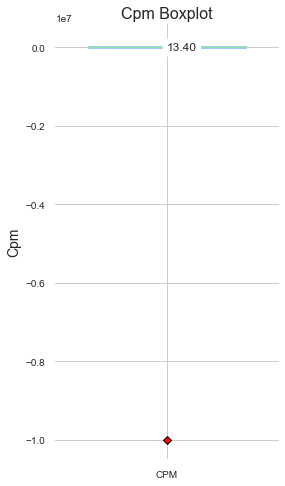

Mean Cpm = 52.10699482275615
Median Cpm = 0.0
Skewness of CPM: -749.9304179686197.
Total number of outliers in CPM distribution: 96101.


In [26]:
box_plot('CPM')

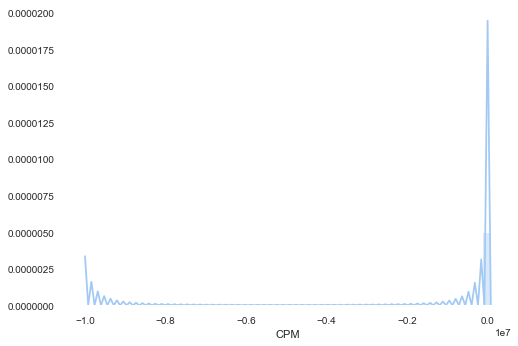

In [27]:
sns.distplot(data['CPM'])
plt.show()

In [28]:
data.dtypes

date                        object
site_id                      int64
ad_type_id                   int64
geo_id                       int64
device_category_id           int64
advertiser_id                int64
order_id                     int64
line_item_type_id            int64
os_id                        int64
integration_type_id          int64
monetization_channel_id      int64
ad_unit_id                   int64
total_impressions          float64
total_revenue              float64
viewable_impressions         int64
measurable_impressions       int64
revenue_share_percent      float64
CPM                        float64
dtype: object

In [29]:
data.isnull().sum()

date                       0
site_id                    0
ad_type_id                 0
geo_id                     0
device_category_id         0
advertiser_id              0
order_id                   0
line_item_type_id          0
os_id                      0
integration_type_id        0
monetization_channel_id    0
ad_unit_id                 0
total_impressions          0
total_revenue              0
viewable_impressions       0
measurable_impressions     0
revenue_share_percent      0
CPM                        0
dtype: int64

In [30]:
data.CPM.fillna(data.CPM.max(),inplace =True)

Binning the CPM value to understand the advertiser with highest CPM

In [31]:
bins = [0,3,5,7,9]
labels = ["low","medium","high","very-high"]
data['Binned_CPM'] = pd.cut(data['CPM'], bins=bins, labels=labels)
data['Binned_CPM'] = pd.cut(data['CPM'], bins=bins, labels=labels)

In [32]:
data.CPM.dtypes

dtype('float64')

In [33]:
data.isnull().sum()

date                            0
site_id                         0
ad_type_id                      0
geo_id                          0
device_category_id              0
advertiser_id                   0
order_id                        0
line_item_type_id               0
os_id                           0
integration_type_id             0
monetization_channel_id         0
ad_unit_id                      0
total_impressions               0
total_revenue                   0
viewable_impressions            0
measurable_impressions          0
revenue_share_percent           0
CPM                             0
Binned_CPM                 412884
dtype: int64

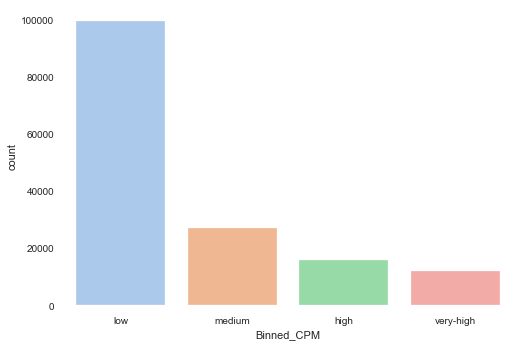

0.0        52.252019
0.2         3.112864
0.4         2.298291
0.6         1.942566
4.0         1.487067
             ...    
1583.4      0.000176
11950.6     0.000176
11922.4     0.000176
3003.6      0.000176
2742.8      0.000176
Name: CPM, Length: 10102, dtype: float64

In [34]:
sns.countplot(x='Binned_CPM',data = data)
plt.show()

data.CPM.value_counts(normalize = True)*100

As per the plot we understand that the advertiser with maximum CPM falls in the first category of the Binned_CPM range

#### Converting date column for further analysis

In [35]:
data["date"] = data["date"].astype('datetime64[ns]') 

In [36]:
data[['day','month','year']] = data.date.apply(lambda x: pd.Series(x.strftime("%d,%m,%Y").split(",")))

In [37]:
data.head()

,date,site_id,ad_type_id,geo_id,device_category_id,advertiser_id,order_id,line_item_type_id,os_id,integration_type_id,...,total_impressions,total_revenue,viewable_impressions,measurable_impressions,revenue_share_percent,CPM,Binned_CPM,day,month,year
0,2019-06-30,351,10,187,2,84,3473,19,60,1,...,16.0,0.0,2,16,1.0,0.0,NaN,30,06,2019
1,2019-06-30,351,10,187,2,84,3473,19,58,1,...,6.0,0.0,0,6,1.0,0.0,NaN,30,06,2019
2,2019-06-30,351,10,147,2,84,3473,19,60,1,...,4.0,0.0,0,4,1.0,0.0,NaN,30,06,2019
3,2019-06-30,351,10,147,2,84,3473,19,58,1,...,4.0,0.0,0,4,1.0,0.0,NaN,30,06,2019
4,2019-06-30,348,10,147,3,79,3463,20,59,1,...,4.0,0.0,0,4,1.0,0.0,NaN,30,06,2019


In [38]:
data.dtypes

date                       datetime64[ns]
site_id                             int64
ad_type_id                          int64
geo_id                              int64
device_category_id                  int64
advertiser_id                       int64
order_id                            int64
line_item_type_id                   int64
os_id                               int64
integration_type_id                 int64
monetization_channel_id             int64
ad_unit_id                          int64
total_impressions                 float64
total_revenue                     float64
viewable_impressions                int64
measurable_impressions              int64
revenue_share_percent             float64
CPM                               float64
Binned_CPM                       category
day                                object
month                              object
year                               object
dtype: object

In [39]:
data["month"] = data["month"].astype('category') 

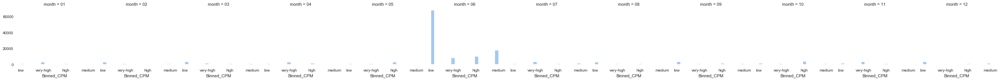

In [40]:
g = sns.FacetGrid(data, col='month')
g.map(plt.hist, 'Binned_CPM', bins=20)